In [1]:
# Importamos las clases que se requieren para manejar los agentes (Agent) y su entorno (Model).
# Cada modelo puede contener múltiples agentes.
from mesa import Agent, Model 

# Debido a que necesitamos que existe un solo agente por celda, elegimos ''SingleGrid''.
from mesa.space import SingleGrid

# Con ''SimultaneousActivation, hacemos que todos los agentes se activen ''al mismo tiempo''.
from mesa.time import SimultaneousActivation

# Haremos uso de ''DataCollector'' para obtener información de cada paso de la simulación.
from mesa.datacollection import DataCollector

# matplotlib lo usaremos crear una animación de cada uno de los pasos del modelo.
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['animation.embed_limit'] = 2**128

# Importamos los siguientes paquetes para el mejor manejo de valores numéricos.
import numpy as np
import pandas as pd

# Definimos otros paquetes que vamos a usar para medir el tiempo de ejecución de nuestro algoritmo.
import time
import datetime

In [2]:
class GameLifeAgent(Agent):
    def __init__(self, unique_id, model):
        super().__init__(unique_id, model)
        self.live = np.random.choice([0, 1])
        self.next_state = None
    
    def step(self):
        live_neighbors = 0
        
        for neighbor in self.model.grid.get_neighbors(self.pos, moore =True, include_center = False):
            live_neighbors= neighbor.live
        
        self.next_state = self.live
        if self.next_state == 1:
            if live_neighbors < 2 or live_neighbors > 3:
                self.next_state = 0
        else:
            if live_neighbors == 3:
                self.next_state = 1
        def advance(self):
            self.live = self.next_state

In [3]:
def get_grid(model):
    grid = np.zeros((model.grid.width, model.grid.height))
    for (content, x, y) in model.grid.coord_iter():
        grid[x][y] = content.live
    return grid

In [4]:
class GameLifeModel(Model):
    def __init__(self, width, height):
        self.num_agents = width * height
        self.grid = SingleGrid(width, height, True)
        self.schedule = SimultaneousActivation(self)
        self.datacollector = DataCollector(model_reporters = {"Grid" : get_grid})
        
        for(content, x, y) in self.grid.coord_iter():
            a = GameLifeAgent((x, y), self)
            self.grid.place_agent(a, (x, y))
            self.schedule.add(a)
    def step(self):
        self.datacollector.collect(self)
        self.schedule.step()

In [9]:
GRID_SIZE = 100
MAX_GENERATIONS = 100

start_time = time.time()
model = GameLifeModel(GRID_SIZE, GRID_SIZE)

for i in range(MAX_GENERATIONS):
    model.step()
print("Tiempo de ejecución:", str(datetime.timedelta(
    seconds= (time.time() - start_time)
)))

Tiempo de ejecución: 0:00:03.235032


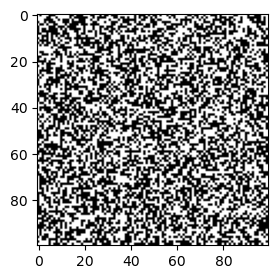

In [10]:
all_grid = model.datacollector.get_model_vars_dataframe()
fig, axs = plt.subplots(figsize=(3,3))
axs.set_xticks = ([])
axs.set_yticks = ([])
patch = plt.imshow(all_grid.iloc[0][0], cmap=plt.cm.binary)

def animate(i):
    patch.set_data(all_grid.iloc[i][0])

anim = animation.FuncAnimation(fig,animate,frames=MAX_GENERATIONS)
anim